## Imports

In [1]:
import os

os.chdir('..')
from scripts import *

## User Input

In [2]:
## wave input
wave_amplitude = 1e-2
wave_period = 4
water_depth = 1

wave_length = wavelength_nwogu(wave_period, water_depth)
print('Wave length: {:.2f}'.format(wave_length))

## model input
wavelegth_dx = 30       # number of grid points per wave length
lx_wavelegth = 30       # domain size per wave length
time_waveperiod = 50    # simulation time in wave periods

grid_size = wave_length / wavelegth_dx
domain_size = wave_length * lx_wavelegth
run_time = wave_period * time_waveperiod
print('Grid size: {:.2f}'.format(grid_size))
print('Domain size: {:.2f}'.format(domain_size))
print('Simulation time: {:.2f}'.format(run_time))

Wave length: 12.00
Grid size: 0.40
Domain size: 360.00
Simulation time: 200.00


## HLL (Harten-Lax-van Leer) scheme

In [3]:
print(f"Current directory: {os.getcwd()}")

Current directory: /home/zahra/Desktop/GitHub/WavePropError


In [4]:
ds_hll = run_sine_wave(
    name_run="HLL",
    scheme=hll,
    order_reconstruction=5,
    order_time_integration=3,
    courant_number=0.9,
    grid_size=grid_size,
    domain_size=domain_size,
    water_depth=water_depth,
    wave_amplitude=wave_amplitude,
    wave_period=wave_period,
    run_time=run_time,
    output_interval=1,
    gauges_locations=[],
    gauges_dt=1,
)

Running HLL...

Input parameters
----------------
Numerical scheme :hll
Order of reconstruction :5
Order of RK time integration :3
Courant number :0.9
Grid spacing :0.400003 m
Length of the domain :360.002 m
Water depth :1 m
Total computation time :200 s
Time step for the output :1 s
Time step for the gauges :1 s
frequency [Hz]           amplitude [m]            phase [rad]              
0.25                     0.01                     0                        

Computation Progress:    
100% [||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||]

The numerical simulation took 3.95363 s


Reading HLL results and converting to xarray.Dataset...
Done!


## HLLC (Harten-Lax-van Leer Contact) scheme

In [5]:
ds_hllc = run_sine_wave(
    name_run="HLLC",
    scheme=hllc,
    order_reconstruction=5,
    order_time_integration=3,
    courant_number=0.9,
    grid_size=grid_size,
    domain_size=domain_size,
    water_depth=water_depth,
    wave_amplitude=wave_amplitude,
    wave_period=wave_period,
    run_time=run_time,
    output_interval=1,
    gauges_locations=[],
    gauges_dt=1,
)

Running HLLC...

Input parameters
----------------
Numerical scheme :hllc
Order of reconstruction :5
Order of RK time integration :3
Courant number :0.9
Grid spacing :0.400003 m
Length of the domain :360.002 m
Water depth :1 m
Total computation time :200 s
Time step for the output :1 s
Time step for the gauges :1 s
frequency [Hz]           amplitude [m]            phase [rad]              
0.25                     0.01                     0                        

Computation Progress:    
100% [||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||]

The numerical simulation took 4.62596 s


Reading HLLC results and converting to xarray.Dataset...
Done!


## Central Upwind Scheme

In [6]:
ds_cu = run_sine_wave(
    name_run="Central_Upwind",
    scheme=central_upwind,
    order_reconstruction=5,
    order_time_integration=3,
    courant_number=0.9,
    grid_size=grid_size,
    domain_size=domain_size,
    water_depth=water_depth,
    wave_amplitude=wave_amplitude,
    wave_period=wave_period,
    run_time=run_time,
    output_interval=1,
    gauges_locations=[],
    gauges_dt=1,
)

Running Central_Upwind...

Input parameters
----------------
Numerical scheme :central_upwind
Order of reconstruction :5
Order of RK time integration :3
Courant number :0.9
Grid spacing :0.400003 m
Length of the domain :360.002 m
Water depth :1 m
Total computation time :200 s
Time step for the output :1 s
Time step for the gauges :1 s
frequency [Hz]           amplitude [m]            phase [rad]              
0.25                     0.01                     0                        

Computation Progress:    
100% [||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||]

The numerical simulation took 3.83865 s


Reading Central_Upwind results and converting to xarray.Dataset...
Done!


## Exact Solution

In [7]:
ds_exact = sine_wave_exact_solution(
    water_depth=water_depth,
    wave_amplitude=wave_amplitude,
    wave_period=wave_period,
    time=ds_hll.time.values,
    x=ds_hll.x,
    time_gauges=ds_hll.time_gauges.values,
    index_gauges=ds_hll.index_gauges.values,
)

## Animation

In [8]:
fig = create_animation_plotly([ds_hll, ds_hllc, ds_cu], ds_exact)

fig.update_layout(yaxis_range=[-0.02, 0.02])
fig.update_layout(width=1600, height=500)

print("Click play to start the animation")

fig.show()

Click play to start the animation


## Plot

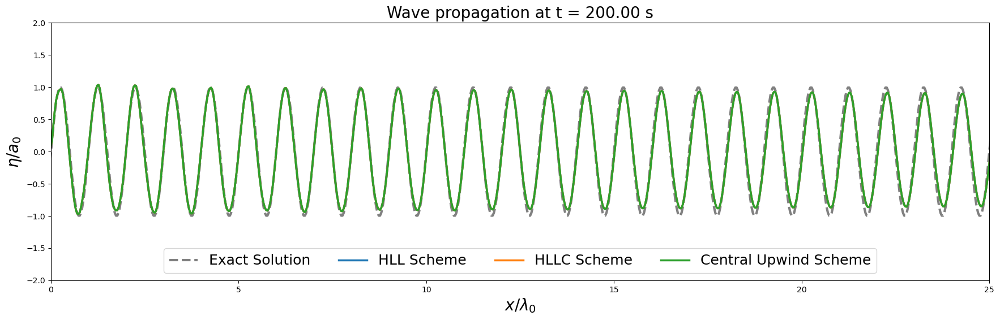

In [9]:
fig, axs = plt.subplots(1, 1, figsize=(18, 6), sharex=True)
plt.rcParams.update({'font.size': 18})

plt.plot(ds_exact.x/wave_length, ds_exact.eta.isel(time=-1)/wave_amplitude, label="Exact Solution", linestyle="--", color="grey", linewidth=3)

plt.plot(ds_hll.x/wave_length, ds_hll.eta.isel(time=-1)/wave_amplitude, label="HLL Scheme", linewidth=2.5)
plt.plot(ds_hllc.x/wave_length, ds_hllc.eta.isel(time=-1)/wave_amplitude, label="HLLC Scheme", linewidth=2.5)
plt.plot(ds_cu.x/wave_length, ds_cu.eta.isel(time=-1)/wave_amplitude, label="Central Upwind Scheme", linewidth=2.5)

plt.xlim([0, 25])
plt.ylim([-2, 2])

plt.xlabel(r"$x / \lambda_0$", fontsize=20)
plt.ylabel(r"$\eta / a_0$", fontsize=20)

plt.legend(loc='lower center', ncol=4, fontsize=18)

plt.title("Wave propagation at t = {:.2f} s".format(ds_hll.time[-1].values), fontsize=20)

plt.tight_layout()

## Difference schemes

In [10]:
hll_hllc = np.abs(ds_hll.eta - ds_hllc.eta).max().values
hll_kurganov = np.abs(ds_hll.eta - ds_cu.eta).max().values
hllc_kurganov = np.abs(ds_hllc.eta - ds_cu.eta).max().values

print("HLL - HLLC: {:.2e}".format(hll_hllc))
print("HLL - Central Upwind: {:.2e}".format(hll_kurganov))
print("HLLC - Central Upwind: {:.2e}".format(hllc_kurganov))

HLL - HLLC: 2.08e-06
HLL - Central Upwind: 2.15e-06
HLLC - Central Upwind: 2.00e-06
